## Setup

In [1]:
import os
from copy import deepcopy
os.environ['CUDA_VISIBLE_DEVICES'] = ''

import numpy as np
import sklearn.decomposition
import matplotlib.pyplot as plt
from hdf5storage import loadmat, savemat

import torch
import torch.nn as nn
import torch.nn.functional as F

from api.preprocessing import sound2coch
from api.librispeech import LibriDataset
from api.model import SpeechRecognitionCTC

# CUDA for PyTorch
device = torch.device("cpu")
print(device)

cpu


## Load trained model

In [2]:
LibriDataset.set_mode('word') # Should be one of 'grapheme', 'phoneme', 'word'

freq_bins = 65
size_vocab = LibriDataset.vocab_size()
print(f'Frequency dimension: {freq_bins}, alphabet size: {size_vocab}')

Frequency dimension: 65, alphabet size: 10002


In [3]:
N_LAYER, N_NODES = 5, 500
model_id = f'{LibriDataset.MODE}-{N_LAYER}-{N_NODES}'
model_arch = dict(rnn_hidden_size=N_NODES, nb_layers=N_LAYER, window_size=1, rnn_stride=1)
model_name = 'models/model-ctc-{:s}'.format(model_id)

print(model_id)

word-5-500


In [4]:
model = SpeechRecognitionCTC(rnn_type=nn.GRU, labels=LibriDataset.alphabet(), **model_arch, freq_bins=freq_bins)
model = model.to(device)

model.load_state_dict(torch.load(f'{model_name}.pt', map_location=device))
model.eval();

## Inferrence

In [30]:
alphabet = LibriDataset.alphabet()
maindir='./sounds/digits/'
subfile='f1SNR_21'
sound_file = maindir+'sounds/'+subfile+'.wav'
cochleagram = sound2coch(sound_file)

pred = model.get_prediction(cochleagram)
actv = model.get_activation(cochleagram)

print(pred)

here
<NIL> ONE TWO THREE FOUR FIVE THICK SEVEN A NINE


## Custom inferrence

In [6]:
# trans = []
# for layer in range(nb_layers):
#     svd = sklearn.decomposition.TruncatedSVD(n_components=65, n_iter=25)
#     svd.fit(acts_libri[layer])
#     trans.append(svd)

In [7]:


model.eval()
with torch.no_grad():
    xs = torch.Tensor(cochleagram).unsqueeze(0)
    xs = xs.type(torch.float32).to(device)
    xlen = torch.LongTensor([xs.shape[1]])
    z, zlen = model.predict(xs, xlen)
    
    zi = [_ for _ in z.squeeze().argmax(dim=1)]
    for i in range(len(zi)-1,0,-1):
        if zi[i] == zi[i-1]: zi = zi[:i-1] + zi[i:]
    zi = [alphabet[_] for _ in zi if _ > 0]
    
    zi = ['<SPACE>' if _ == LibriDataset.SYM_SPACE else _ for _ in zi]
    zi = ' '.join(zi)
    
    print(zi)
    print()
    
    activation = model.activations(xs)
    activation = [x.squeeze(0).numpy().astype('float32') for x in activation]
    # activation = [trans[layer].transform(activation[layer]) for layer in range(nb_layers)]

<NIL> ONE TWO THREE FOUR FIVE THICK SEVEN A NINE



In [8]:
print(' '.join([str(x.shape) for x in activation]))

(1145, 500) (1145, 500) (1145, 500) (1145, 500) (1145, 500)


In [9]:
# savemat(f'activations-ctc-{model_id}-100hz-20ms.mat', mdict={'acts_neural': acts_neural, 'stim_neural': stim_neural})

# Looking at the activztion of layers

In [10]:
import wave
w = wave.open(sound_file, 'r')
print(cochleagram.shape)
sr=w.getnframes()/cochleagram.shape[0]
print(w.getnframes()/16000*100)
print(cochleagram.shape[0]/100)

(1145, 65)
1124.8062499999999
11.45


In [11]:
from utils import load_data_5
name=maindir
phname, nphonemes, phonemes, wrdname, nwords, words= load_data_5(name, subfile)
    

f1SNR_21.phn


In [12]:
PhnList=[]
fileN=0;
for i in np.arange(len(phonemes[fileN])):
    if phonemes[fileN][i][2] not in PhnList:
        PhnList.append(phonemes[fileN][i][2])
# list of phonemes
phnlist=[]
for phnB in PhnList:
    if phnB[:2] not in phnlist:
        phnlist.append(phnB[:2])
print(phnlist)

['sp', 'Z', 'IY', 'R', 'OW', 'W', 'AH', 'N', 'T', 'UW', 'TH', 'F', 'AO', 'AY', 'V', 'S', 'IH', 'K', 'EH', 'EY']


In [13]:
# finding where each phoneme happens (phnIns short fot phn instances)
phnIns=[]
for phn in phnlist:
    idx=[idd for idd,phnInf in enumerate(phonemes[fileN]) if phn == phnInf[2][:2]]
    phnIns.append([phn, idx])


In [14]:
maxV=0
for st in phonemes[fileN]:
    dif=np.round((st[1]*100))
    if dif> maxV and st[2]!='sp':
        maxV=dif
print(maxV)

1098.0


In [15]:
# Finding the average activity for each phoneme for Each Neuron
Window=1.20*100
phn_actv=np.zeros((N_LAYER,N_NODES,len(phnIns), int(Window)) )
for layer in range(N_LAYER):
    for node in range(N_NODES):
        for idd,phn in enumerate(phnIns):
            activity=[0]*int(Window)
            counter=0
            for idx in phn[1]:
                time=np.arange(np.round(phonemes[fileN][idx][0]*100)-20,np.round(phonemes[fileN][idx][0]*100)+100)
                if time[-1]<=cochleagram.shape[0]:
                    counter+=1
                    activity+=np.array(activation[layer][time.astype('int'), node])
                    #activity=[x+activity[i] for i, x in enumerate(activation[layer][time.astype('int'), node])]
            #activity=[x/counter for x in activity]
            activity=activity/counter
            # now we have acrtivation for each phn for each node, layer
            phn_actv[layer, node,idd,:]=np.array(activity)

                
            
    

In [16]:
print(phn_actv.shape)

(5, 500, 20, 120)


# Checking to see if there are any neurons sensetive to phonemes 

(20,)


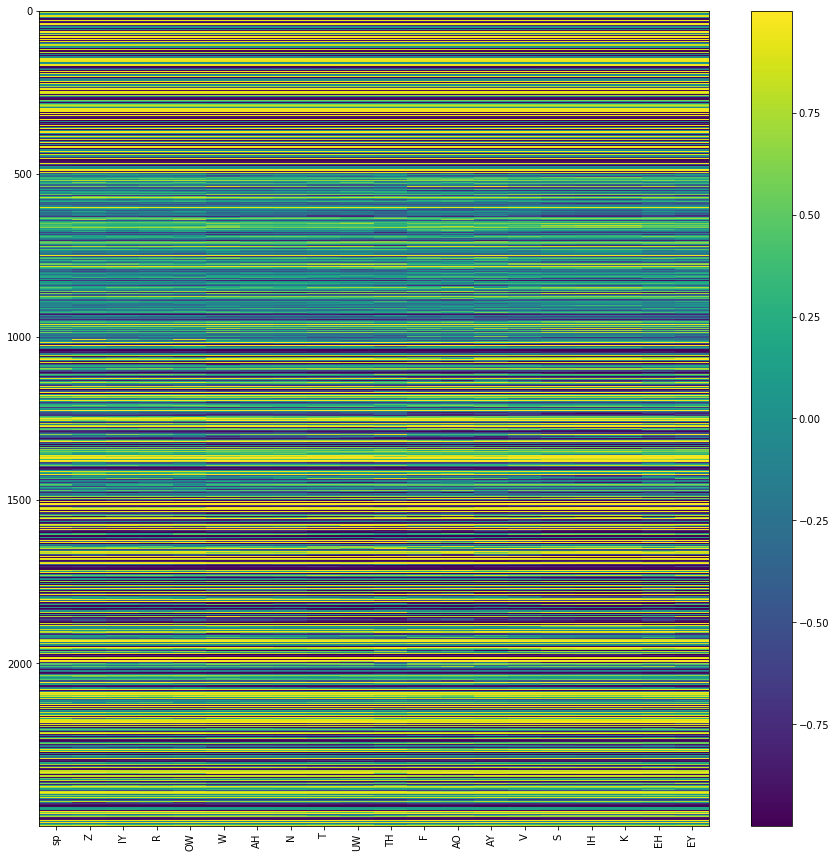

In [17]:
# for each neuron plot the avg for each phoneme:
import numpy.matlib
from scipy import stats
AVG_N_Phn=np.mean(phn_actv, axis=3) # avg act for each phn for neuron
AVG_N_Phn=AVG_N_Phn.reshape((N_LAYER*N_NODES,len(phnlist))) #rezhape to (layers*neuron)*phn
#AVG_N_Phn=AVG_N_Phn/np.amax(np.abs(AVG_N_Phn), axis=1)[:,None]# normalizing values for each neuron
#AVG_N_Phn=stats.zscore(AVG_N_Phn, axis=1)
print(np.amax(AVG_N_Phn, axis=0).shape)
plt.figure(figsize=(15,15))
plt.imshow(AVG_N_Phn,aspect='auto')
plt.colorbar()
plt.xticks(range(len(phnlist)),phnlist, rotation='vertical')
plt.show()



# Activity based on phonetic features

In [18]:
import Phn_Attr as PA

Nattr=len(PA.attribute2phoneme(None,cmd='list'))
phnAttrIns=[]
for attrID in range(Nattr):
    attrIns=[]
    for phn in phnIns:
        if PA.phoneme2attrlist(phn[0])[attrID]==1:
            attrIns+= phn[1]
    phnAttrIns.append(attrIns)
    


In [ ]:
# Finding the average activity for each phoneme for Each Neuron
Window=1.20*100
phon_actv=np.zeros((N_LAYER,N_NODES,Nattr, int(Window)) )
for layer in range(N_LAYER):
    for node in range(N_NODES):
        for idd,phon in enumerate(phnAttrIns):
            activity=np.array([0.0]*int(Window))
            counter=0
            for idx in phon:
                time=np.arange(np.round(phonemes[fileN][idx][0]*100)-20,np.round(phonemes[fileN][idx][0]*100)+100)
                if time[-1]<=cochleagram.shape[0]:
                    counter+=1
                    activity+=np.array(activation[layer][time.astype('int'), node])
                    #activity=[x+activity[i] for i, x in enumerate(activation[layer][time.astype('int'), node])]
            #activity=[x/counter for x in activity]
            activity=activity/counter
            # now we have acrtivation for each phn for each node, layer
            phon_actv[layer, node,idd,:]=np.array(activity)


[2.97775769 2.97891957 2.97955596 2.97994733 2.98017257 2.98029476
 2.98029697 2.98040557 2.97999334 2.97978866 2.97965771 2.97973317
 2.97989482 2.98000813 2.98010641 2.98020631 2.98030001 2.98040885
 2.98051685 2.98065227 2.98086131 2.98119855 2.98136759 2.98148006
 2.9814015  2.98122829 2.9809581  2.9807204  2.98063099 2.98057896
 2.98062539 2.98085529 2.98114628 2.98134154 2.98150229 2.98154879
 2.98145443 2.98148358 2.98143613 2.98134661 2.98132116 2.98137492
 2.98140329 2.98134369 2.98124254 2.98105049 2.98088855 2.98078251
 2.98058486 2.98046559 2.9804495  2.98040175 2.98037404 2.98031133
 2.98031235 2.98030889 2.98035729 2.98035491 2.98030889 2.98036009
 2.98039842 2.98034602 2.9803434  2.98040169 2.98047918 2.98057085
 2.98059297 2.98067176 2.9807955  2.98091632 2.98096055 2.98098558
 2.98108941 2.98101729 2.98105717 2.98113245 2.98112053 2.98110956
 2.98099989 2.98103577 2.98096216 2.98093027 2.98089921 2.98084056
 2.98079973 2.98078978 2.98073763 2.98071939 2.98074472 2.9807

/Users/alizare/opt/anaconda3/envs/envTF113/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


[1.84993052 1.84981525 1.84965909 1.84918952 1.84933835 1.84973013
 1.84979779 1.84957361 1.84955031 1.84936506 1.84941453 1.84973288
 1.84994054 1.84942418 1.84920073 1.8486734  1.84873676 1.84847289
 1.84857017 1.84881878 1.84972328 1.84915245 1.84707206 1.84487557
 1.84320056 1.8421616  1.84161723 1.84158921 1.84162307 1.84172612
 1.84195435 1.84216738 1.84240043 1.84277707 1.84304076 1.84340286
 1.84344727 1.84363234 1.8438462  1.84401661 1.8444733  1.84488511
 1.84509689 1.84531802 1.84541976 1.84568894 1.84567797 1.84574324
 1.84590137 1.84611756 1.84628016 1.84669816 1.84719956 1.84735376
 1.84744978 1.8476668  1.84783083 1.84849262 1.84953159 1.85060322
 1.8516379  1.85177761 1.85172236 1.85146391 1.85135102 1.85101914
 1.85056806 1.85004389 1.84983659 1.84969622 1.85002011 1.84992868
 1.85015225 1.8501482  1.84940654 1.84927768 1.84929854 1.8497529
 1.8499186  1.8497436  1.850025   1.85001707 1.84999436 1.85010052
 1.84992748 1.84970653 1.84975719 1.84978259 1.84974533 1.85015

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.24054295 0.28396321 0.26052009 0.29518136 0.27751659 0.29005946
 0.29509559 0.29038773 0.30159058 0.26676761 0.23709887 0.25543783
 0.24330572 0.26611246 0.24441242 0.21054896 0.23111962 0.26391954
 0.27209638 0.25136039 0.27783762 0.28025336 0.19669509 0.24224509
 0.2070195  0.20426552 0.19557913 0.210222   0.22597196 0.24655636
 0.21624444 0.23452417 0.21319747 0.21921219 0.19244957 0.13408615
 0.18110409 0.20698127 0.25569325 0.20115732 0.21803085 0.21632743
 0.23210499 0.21281856 0.18289122 0.15964188 0.15687812 0.14518566
 0.170459   0.16241542 0.18365068 0.19868068 0.18736521 0.21571359
 0.21259248 0.24432269 0.24551397 0.21661886 0.23994227 0.23043271
 0.22010333 0.21808893 0.23654216 0.23436989 0.22938416 0.23474478
 0.27414149 0.25692963 0.25199674 0.23973932 0.23756435 0.25661899
 0.26919535 0.25330773 0.24767698 0.24759619 0.23626649 0.24934484
 0.28537337 0.29347173 0.28959724 0.29416905 0.27523365 0.29815844
 0.28713247 0.3051029  0.272987   0.30186898 0.3098504  0.2827

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-11.03932434 -11.04165065 -11.04273123 -11.04275262 -11.0422591
 -11.04198587 -11.04159456 -11.03948194 -11.0369482  -11.03476769
 -11.03311563 -11.03285515 -11.03353608 -11.03348255 -11.03494787
 -11.03655809 -11.03981596 -11.04042876 -11.0423488  -11.04401356
 -11.0449869  -11.04696125 -11.0471881  -11.04610926 -11.0455066
 -11.04847741 -11.05022532 -11.05172271 -11.05071968 -11.049465
 -11.05064219 -11.05095041 -11.04987037 -11.048042   -11.04551673
 -11.04246795 -11.03946996 -11.03838527 -11.03738695 -11.0377019
 -11.03789198 -11.03787071 -11.03780234 -11.03871018 -11.03877449
 -11.03969949 -11.04011184 -11.04047787 -11.03945941 -11.03964418
 -11.04038292 -11.04089653 -11.04113805 -11.04023027 -11.04133713
 -11.04167444 -11.04121596 -11.04227901 -11.04238689 -11.04210806
 -11.04258597 -11.04175669 -11.04236472 -11.04237449 -11.04171526
 -11.04235429 -11.04185319 -11.0427435  -11.04302812 -11.04355264
 -11.04343802 -11.04332739 -11.04374129 -11.0436213  -11.04432404
 -11.04446089 -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[8.04983968 8.05048847 8.05010611 8.04793674 8.04719061 8.04828656
 8.04756176 8.04568809 8.04409623 8.04300642 8.0405786  8.03943735
 8.03958195 8.03869885 8.03587723 8.03648126 8.0371331  8.03651857
 8.03720391 8.03763074 8.03635788 8.03604585 8.03796268 8.04032081
 8.04388523 8.04880673 8.05271351 8.05472958 8.05211633 8.05059266
 8.04830843 8.04734254 8.04421663 8.04277647 8.04294926 8.04421687
 8.04140985 8.03825748 8.03601032 8.03551394 8.03751016 8.03861791
 8.04171109 8.04183817 8.04126799 8.04237777 8.04185653 8.04207569
 8.04148185 8.04122627 8.04113466 8.04098713 8.04054838 8.04059237
 8.04079527 8.04102188 8.0414142  8.04200613 8.04155934 8.04214269
 8.04332894 8.04173553 8.04155165 8.04238963 8.04241663 8.04012275
 8.03798765 8.03544909 8.0352208  8.03442925 8.03499365 8.03516567
 8.03553653 8.03652322 8.03636694 8.03733104 8.03921598 8.0397529
 8.0414474  8.04167044 8.04335308 8.04410762 8.04314446 8.04434997
 8.04599184 8.04537773 8.04567319 8.04618382 8.04552078 8.0463

(22,)
(2500, 22)


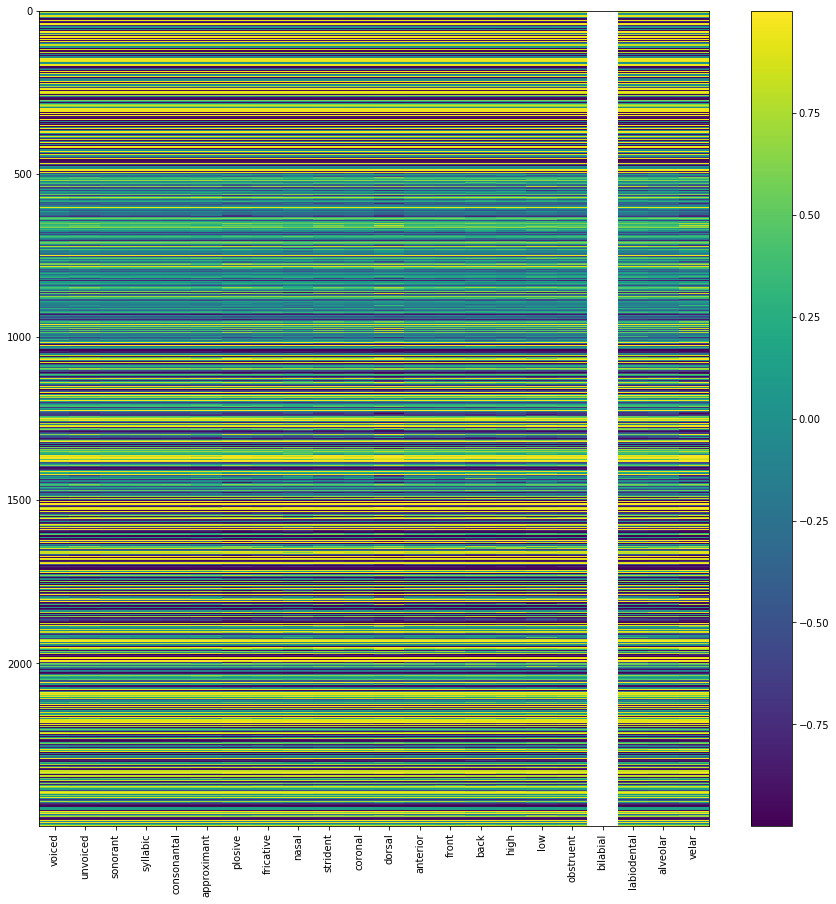

In [23]:
AVG_N_Phon=np.mean(phon_actv, axis=3) # avg act for each phn for neuron
AVG_N_Phon=AVG_N_Phon.reshape((N_LAYER*N_NODES,Nattr)) #rezhape to (layers*neuron)*phn
#AVG_N_Phn=AVG_N_Phn/np.amax(np.abs(AVG_N_Phn), axis=1)[:,None]# normalizing values for each neuron
#AVG_N_Phon=stats.zscore(AVG_N_Phon, axis=1)
print(np.amax(AVG_N_Phon, axis=0).shape)
plt.figure(figsize=(15,15))
plt.imshow(AVG_N_Phon,aspect='auto')
print(AVG_N_Phon.shape)
plt.colorbar()
plt.xticks(range(Nattr),PA.attribute2phoneme(None,cmd='list'), rotation='vertical')
plt.show()

# Looking at the activations and their clasification

In [ ]:
# get some features from activations for 